In [24]:
import warnings
from scipy.linalg import svd
warnings.filterwarnings("ignore")
from colorama import init, Fore, Back, Style
import pandas as pd
import numpy as np
import seaborn as sns
import re
import shap
from dash import dcc, html, dash_table, Input, Output
import dash_bootstrap_components as dbc
from collections import Counter
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
from scipy.stats import kurtosis, skew, iqr, probplot
from statsmodels.robust import mad
import ipywidgets as widgets
from IPython.display import display, clear_output
import dash
import dash_core_components as dcc
import dash_html_components as html
import dash_table
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as stats




### Data Collection

In [2]:
import glob

dnames = ["train_FD002","test_FD002","RUL_FD002"]
rnames = ["train","test","RUL"]
for i,dname in enumerate(dnames):
    read_files = glob.glob(f"/Users/aswathshakthi/PycharmProjects/MLOps/Predictive_maintenance/data/raw/{dname}.txt")
    with open(f"/Users/aswathshakthi/PycharmProjects/MLOps/Predictive_maintenance/data/interim/{rnames[i]}.txt", "wb") as outfile:
        for f in read_files:
            with open(f, "rb") as infile:
                outfile.write(infile.read())
            


In [3]:
# Give names to the features
index_names = ['engine', 'cycle']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names=[ "(Fan inlet temperature) (◦R)",
               "(LPC outlet temperature) (◦R)",
               "(HPC outlet temperature) (◦R)",
               "(LPT outlet temperature) (◦R)",
               "(Fan inlet Pressure) (psia)",
               "(bypass-duct pressure) (psia)",
               "(HPC outlet pressure) (psia)",
               "(Physical fan speed) (rpm)",
               "(Physical core speed) (rpm)",
               "(Engine pressure ratio(P50/P2)",
               "(HPC outlet Static pressure) (psia)",
               "(Ratio of fuel flow to Ps30) (pps/psia)",
               "(Corrected fan speed) (rpm)",
               "(Corrected core speed) (rpm)",
               "(Bypass Ratio) ",
               "(Burner fuel-air ratio)",
               "(Bleed Enthalpy)",
               "(Required fan speed)",
               "(Required fan conversion speed)",
               "(High-pressure turbines Cool air flow)",
               "(Low-pressure turbines Cool air flow)" ]
col_names = index_names + setting_names + sensor_names

df_train = pd.read_csv(('/Users/aswathshakthi/PycharmProjects/MLOps/Predictive_maintenance/data/interim/train.txt'), sep='\s+', header=None, names=col_names)
df_test = pd.read_csv(('/Users/aswathshakthi/PycharmProjects/MLOps/Predictive_maintenance/data/interim/test.txt'), sep='\s+', header=None, names=col_names)
df_test_RUL = pd.read_csv(('/Users/aswathshakthi/PycharmProjects/MLOps/Predictive_maintenance/data/interim/RUL.txt'), sep='\s+', header=None, names=['RUL'])

In [4]:
df_train

,engine,cycle,setting_1,setting_2,setting_3,(Fan inlet temperature) (◦R),(LPC outlet temperature) (◦R),(HPC outlet temperature) (◦R),(LPT outlet temperature) (◦R),(Fan inlet Pressure) (psia),...,(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Corrected core speed) (rpm),(Bypass Ratio),(Burner fuel-air ratio),(Bleed Enthalpy),(Required fan speed),(Required fan conversion speed),(High-pressure turbines Cool air flow),(Low-pressure turbines Cool air flow)
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,183.06,2387.72,8048.56,9.3461,0.02,334,2223,100.00,14.73,8.8071
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,130.42,2387.66,8072.30,9.3774,0.02,330,2212,100.00,10.41,6.2665
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,164.22,2028.03,7864.87,10.8941,0.02,309,1915,84.93,14.08,8.6723
3,1,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,130.72,2387.61,8068.66,9.3528,0.02,329,2212,100.00,10.59,6.4701
4,1,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,164.31,2028.00,7861.23,10.8963,0.02,309,1915,84.93,14.13,8.5286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53754,260,312,20.0037,0.7000,100.0,491.19,608.79,1495.60,1269.51,9.35,...,314.05,2389.02,8169.64,9.3035,0.03,369,2324,100.00,24.36,14.5189
53755,260,313,10.0022,0.2510,100.0,489.05,605.81,1514.32,1324.12,10.52,...,371.22,2388.42,8245.36,8.7586,0.03,374,2319,100.00,28.10,16.9454
53756,260,314,25.0041,0.6200,60.0,462.54,537.48,1276.24,1057.92,7.05,...,163.74,2030.33,7971.25,11.0657,0.02,310,1915,84.93,14.19,8.5503
53757,260,315,25.0033,0.6220,60.0,462.54,537.84,1272.95,1066.30,7.05,...,164.37,2030.35,7972.47,11.0537,0.02,311,1915,84.93,14.05,8.3729


### EDA

### Dataset Section

In [5]:
import pandas as pd

def generate_eda_report(df):
    report = []

    # Number of variables
    num_variables = len(df.columns)
    report.append(f"Number of variables: {num_variables}")

    # Number of observations
    num_observations = len(df)
    report.append(f"Number of observations: {num_observations}")

    # Total missing count
    total_missing = df.isna().sum().sum()
    report.append(f"Total missing values: {total_missing}")

    # Total cell size
    total_values = df.size
    report.append(f"Total cell size: {total_values}")

    # Total missing percentage
    missing_percentage = (total_missing / total_values) * 100
    report.append(f"Percentage of missing values: {missing_percentage:.2f}%")

    # Check for duplicated rows
    duplicated_rows = df.duplicated().sum()
    report.append(f"Number of duplicated rows: {duplicated_rows}")

    # Data type counts
    datatype_counts = df.dtypes.value_counts()
    report.append("Data type counts:")
    for dtype, count in datatype_counts.items():
        report.append(f"  {dtype}: {count}")
    
    return '\n'.join(report)
eda_report = generate_eda_report(df_train)
print(eda_report)

Number of variables: 26
Number of observations: 53759
Total missing values: 0
Total cell size: 1397734
Percentage of missing values: 0.00%
Number of duplicated rows: 0
Data type counts:
  float64: 22
  int64: 4


### Variable Section - Numerical

In [6]:
data = df_train["(Required fan speed)"]
#distinct count aka cardinality
distinct_count = data.nunique()

#unique Count
counteru = Counter(data)
unique_values = [item for item, count in counteru.items() if count == 1]
unique_count = len(unique_values)

# Unique %
unique_percent = len(unique_values)/len(data)

#missing count
missing_count = data.isna().sum()

#missing percentage
missing_percentage = (missing_count/len(data)) * 100

#Zeros count
zero_count = np.nonzero(data)[0].size

#zeros percentage
zero_percent = (zero_count/len(data))*100

#negative values
neg_values = (data.values < 0).sum()

#negative %
neg_percent = (neg_values/len(data))*100

#minimum value
min_value = min(data)

# percentile
percentle = np.percentile(data,[5,25,50,75,95])
percen_5 = percentle[0]
Q1 = percentle[1]
median = percentle[2]
Q3 = percentle[3]
Percen_95 = percentle[4]

#max value
max_value = max(data)

#range
ranges = max_value - min_value

#IQR
IQR = Q3 - Q1

#varaince
variance = np.var(data)

#sd
std = np.std(data)

#mean
mean = np.mean(data)

#outlier
#z-score method
z_scores = [(x - mean) / std for x in data]
outliers_z = [x for x, z in zip(data, z_scores) if abs(z) > 3]

#IQR method
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers_I = [x for x in data if x < lower_bound or x > upper_bound]

#coeff of varaince
coeff_var = (std/mean)*100

#kurtosis
kurt = stats.kurtosis(data)

#median absolute deviation
abs_dev = np.abs(data - median)
med_ad = abs_dev.median()

#skewness
skewness = stats.skew(data)

#sum
sums = data.sum()


In [7]:
# class imbalance check

# Count the instances of each class
class_counts = data.value_counts()
print("Class counts:\n", class_counts)

# Calculate the imbalance ratio
majority_class_count = class_counts.max()
minority_class_count = class_counts.min()
imbalance_ratio = majority_class_count / minority_class_count
print(f"\nImbalance ratio: {imbalance_ratio:.2f}")

# Determine if the data is imbalanced based on a threshold
threshold = 2  # You can adjust this threshold as needed
is_imbalanced = imbalance_ratio > threshold
print(f"\nIs the data imbalanced? {'Yes' if is_imbalanced else 'No'}")


Class counts:
 (Required fan speed)
2212    13458
2324     8122
2319     8096
2388     8044
2223     8037
1915     8002
Name: count, dtype: int64

Imbalance ratio: 1.68

Is the data imbalanced? No


In [8]:
from scipy.stats import shapiro, kstest, anderson

# Shapiro-Wilk test
shapiro_stat, shapiro_p = shapiro(data)
shapiro_result = "normally distributed" if shapiro_p > 0.05 else "not normally distributed"
print(f"Shapiro-Wilk Test: Statistic={shapiro_stat:.4f}, p-value={shapiro_p:.4f} (Data is {shapiro_result})")

# Kolmogorov-Smirnov test
ks_stat, ks_p = kstest(data, 'norm')
ks_result = "normally distributed" if ks_p > 0.05 else "not normally distributed"
print(f"Kolmogorov-Smirnov Test: Statistic={ks_stat:.4f}, p-value={ks_p:.4f} (Data is {ks_result})")

# Anderson-Darling test
anderson_result = anderson(data, dist='norm')
anderson_stat = anderson_result.statistic
anderson_crit = anderson_result.critical_values
anderson_result_text = "normally distributed" if anderson_stat < anderson_crit[2] else "not normally distributed"
print(f"Anderson-Darling Test: Statistic={anderson_stat:.4f}, Critical Values={anderson_crit} (Data is {anderson_result_text})")


Shapiro-Wilk Test: Statistic=0.7732, p-value=0.0000 (Data is not normally distributed)
Kolmogorov-Smirnov Test: Statistic=1.0000, p-value=0.0000 (Data is not normally distributed)
Anderson-Darling Test: Statistic=4675.6541, Critical Values=[0.576 0.656 0.787 0.918 1.092] (Data is not normally distributed)


In [9]:
# PLots
import plotly.express as px
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Violin(x=data,marker_color = 'indianred',box_visible=False,name=data.name,meanline_visible=True,points='all'))
fig.add_trace(go.Box(x=data,marker_color = 'lightseagreen',boxpoints='suspectedoutliers',boxmean='sd',name=data.name))

fig.show()


In [10]:
#histogram
import plotly.express as px
fig = px.histogram(data, x=data,labels={'x':data.name},histnorm='probability density')
fig.show()

In [11]:
#QQ Plot
# Generate the theoretical quantiles
theoretical_quantiles = np.linspace(0, 1, len(data))
theoretical_quantiles = stats.norm.ppf(theoretical_quantiles)

# Sort the data and calculate the sample quantiles
sorted_data = np.sort(data)

# Create the QQ plot
fig = go.Figure()

# Add scatter plot for QQ plot
fig.add_trace(go.Scatter(
    x=theoretical_quantiles,
    y=sorted_data,
    mode='markers',
    marker=dict(color='blue'),
    name='Sample Data'
))

# Add a line for y=x (the 45-degree line)
fig.add_trace(go.Scatter(
    x=theoretical_quantiles,
    y=theoretical_quantiles,
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='Theoretical Quantiles'
))

fig.update_layout(
    title="QQ Plot",
    xaxis_title="Theoretical Quantiles",
    yaxis_title="Sample Quantiles",
    showlegend=True
)

fig.show()


### Categorical data

In [12]:
# distinct_count_c = data.nunique()

In [13]:
# unique Count
# counteruc = Counter(data)
# unique_values_c = [item for item, count in counteruc.items() if count == 1]
# unique_count_c = len(unique_values_c)
# 
# # Unique %
# unique_percent_c = len(unique_values_c)/len(data)

In [14]:
# #missing count
# missing_count_c = data.isna().sum()
# 
# #missing percentage
# missing_percentage_c = (missing_count_c/len(data)) * 100


In [15]:
# #mean-leangth
# len_mean = data.str.len().mean()
# len_sd = data.str.len().std()

In [16]:
# len_median = data.str.len().median()
# len_min = data.str.len().min()
# len_max = data.str.len().max()

In [17]:
# sample_one = data.sample(frac=0.5, random_state=42, replace=True)
# 
# # Function to find the value at a given percentile
# def percentile_value(sample_one, percentile):
#     index = int((len(sample_one) - 1) * percentile)
#     return sample_one.iloc[index]
# 
# percentile_1st = sample_one.iloc[0]
# percentile_25th = percentile_value(sample_one, 0.25)
# percentile_50th = percentile_value(sample_one, 0.5)
# percentile_75th = percentile_value(sample_one, 0.75)
# percentile_last = sample_one.iloc[-1]

In [18]:
# let_cnt = data.str.len().sum()

In [19]:

# top_10_df = pd.DataFrame(Counter(re.findall(r'\b\w+\b', ' '.join(data).lower())).most_common(10), columns=['Word', 'Frequency'])
# print(top_10_df)


In [20]:
# Convert to DataFrame for better readability
# special_char_df = pd.DataFrame(Counter(re.findall(r'[^\w\s]', ' '.join(data))).items(), columns=['Special Character', 'Frequency'])
# 
# print(special_char_df)


#### Correlation

In [21]:
def calculate_correlation_stats(df):
    corr_methods = ['pearson', 'spearman', 'kendall']
    stats = ['Highest Positive Correlation', 'Highest Negative Correlation', 'Lowest Correlation', 'Mean Correlation']
    results = {method: {stat: None for stat in stats} for method in corr_methods}
    
    for method in corr_methods:
        corr_matrix = df.corr(method=method)
        np.fill_diagonal(corr_matrix.values, np.nan)  # Ignore self-correlation
        correlations = corr_matrix.unstack().dropna()
        
        results[method]['Highest Positive Correlation'] = correlations.max()
        results[method]['Highest Negative Correlation'] = correlations.min()
        results[method]['Lowest Correlation'] = correlations.abs().min()
        results[method]['Mean Correlation'] = correlations.mean()
    
    return pd.DataFrame(results)

correlation_stats = calculate_correlation_stats(df_train)
print(correlation_stats)

                               pearson  spearman   kendall
Highest Positive Correlation  1.000000  1.000000  1.000000
Highest Negative Correlation -0.987344 -0.983598 -0.909289
Lowest Correlation            0.000039  0.000004  0.000006
Mean Correlation              0.358917  0.342738  0.276695


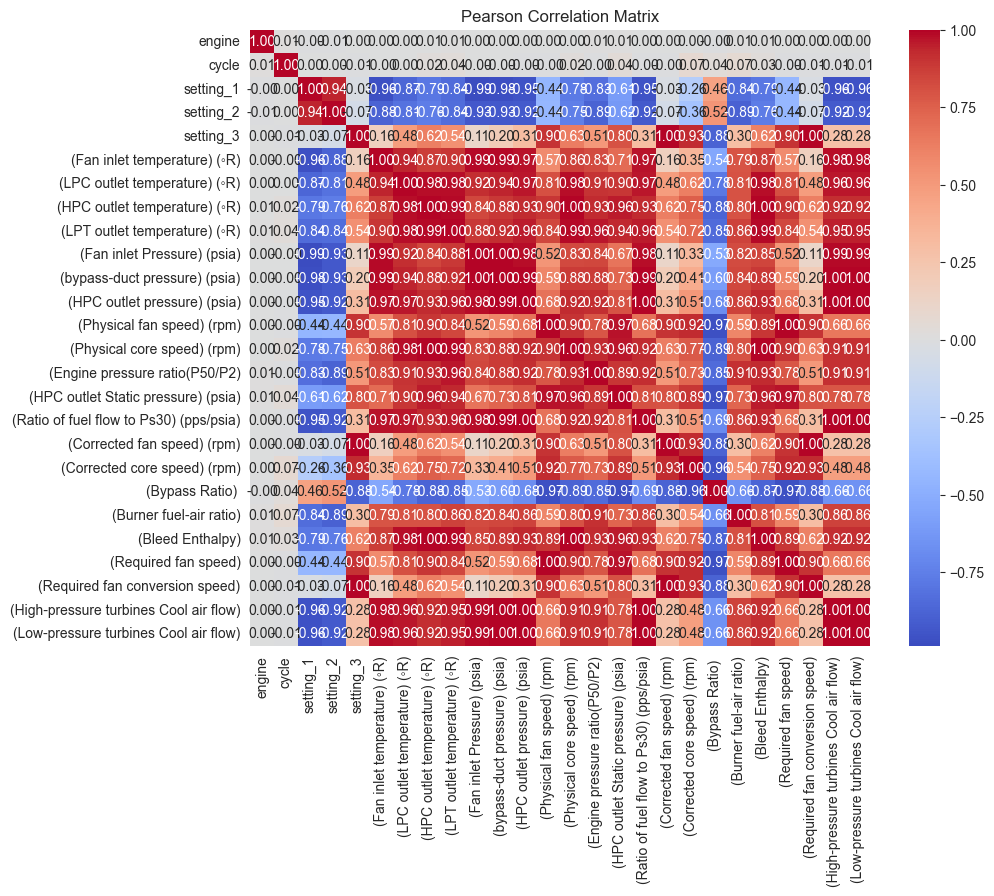

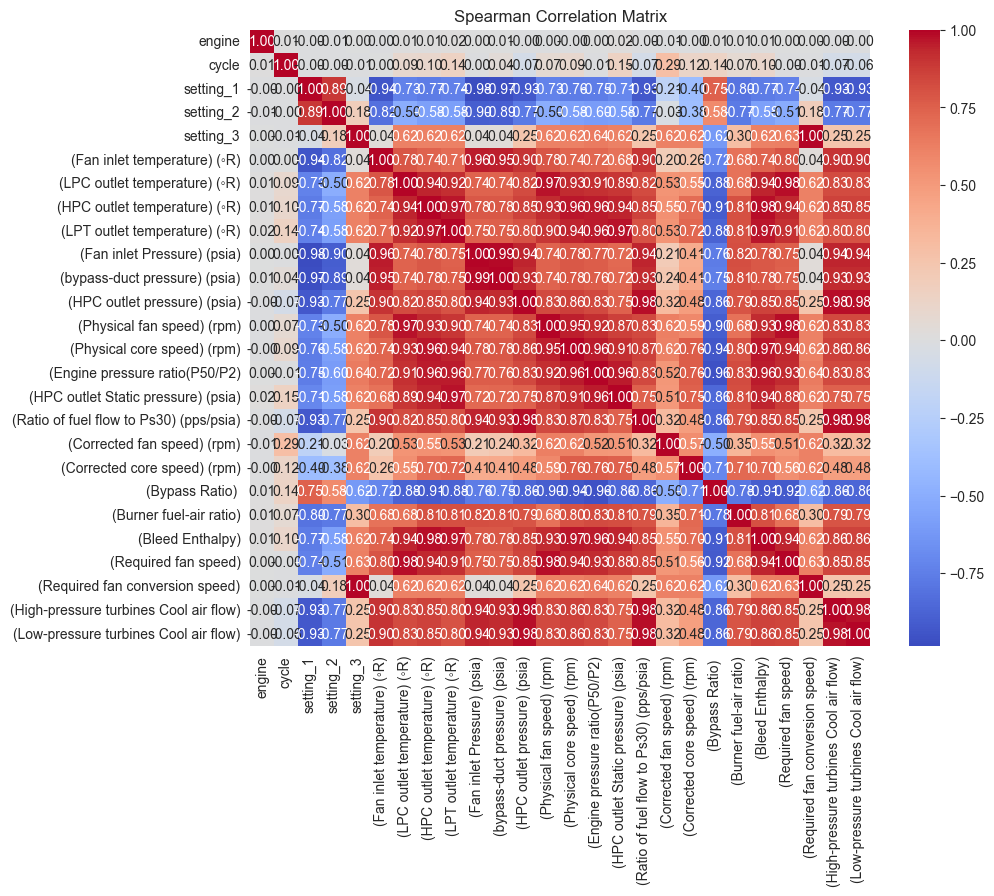

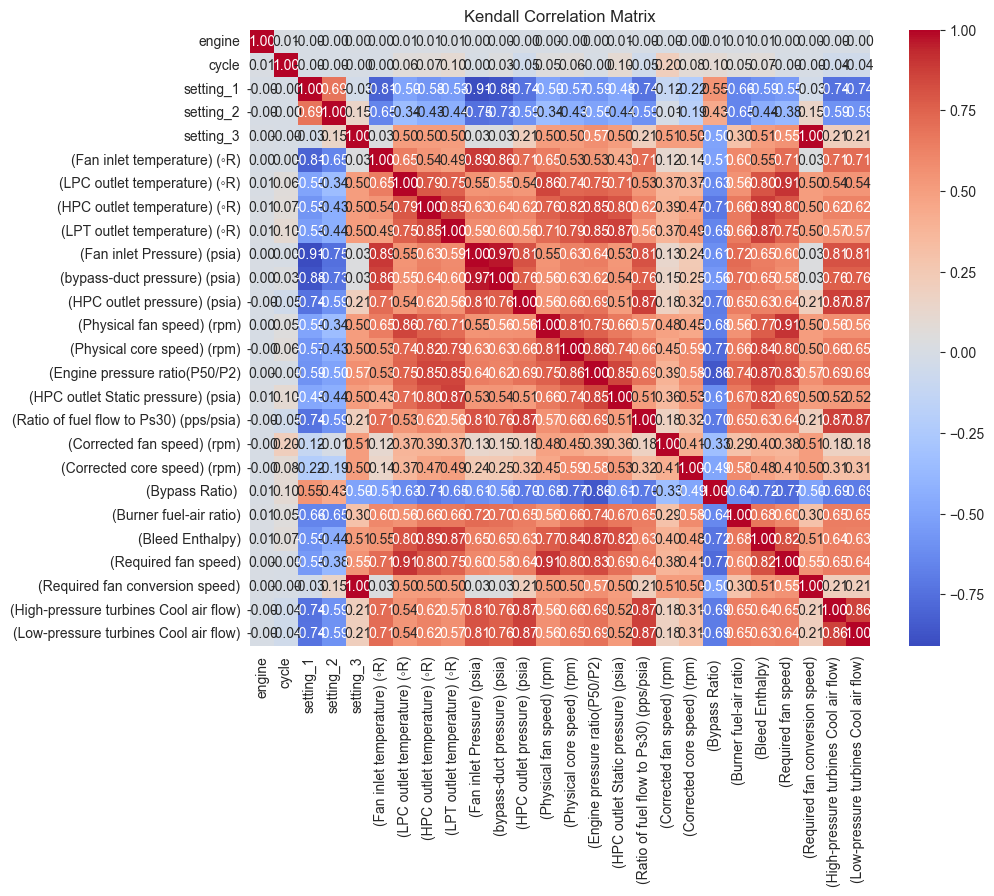

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_correlation_matrices(df):
    corr_methods = ['pearson', 'spearman', 'kendall']
    
    for method in corr_methods:
        corr_matrix = df.corr(method=method)
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
        plt.title(f'{method.capitalize()} Correlation Matrix')
        plt.show()

# Example usage
plot_correlation_matrices(df_train)


### Cleaning

### Feature Engineering

In [28]:
df_train_RUL = df_train.groupby(['engine']).agg({'cycle':'max'})
df_train_RUL.rename(columns={'cycle':'life'},inplace=True)
df_train_RUL.head()

,life
engine,
1,149
2,269
3,206
4,235
5,154


In [30]:
df_train = df_train.merge(df_train_RUL,on='engine',how='left')

In [31]:
df_train['RUL']=df_train['life']-df_train['cycle']
df_train.drop(['life'],axis=1,inplace=True)

### Feature Selection

In [46]:
# VIF - Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Function to calculate VIF and filter columns with VIF > threshold
def calculate_vif(X, threshold=10):
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    # Identify columns with VIF greater than threshold
    high_vif_cols = vif_data[vif_data["VIF"] > threshold]["feature"].tolist()
    print(high_vif_cols)
    # Drop columns with high VIF
    df_train_prc = X.drop(columns=high_vif_cols)
    
    return df_train_prc, vif_data

# Extract predictors (X) and drop target column ('RUL' in this example)
X = df_train.drop('RUL', axis=1)

# Calculate VIF and get filtered DataFrame
df_train_prc, vif_df = calculate_vif(X)

# Print VIF values
print("VIF values:")
print(vif_df)

8562160.0

### Feature Importance
##### Shap

In [ ]:

# Load your dataset
df = pd.read_csv('your_dataframe.csv')
X = df.drop('target', axis=1)
y = df['target']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a model
model = RandomForestClassifier()
model.fit(X_train, y_train)

# Initialize SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test)

# Bar plot
shap.summary_plot(shap_values, X_test, plot_type="bar")

# Dependence plot
shap.dependence_plot("some_feature", shap_values.values, X_test)

# Force plot for a single prediction
shap.force_plot(explainer.expected_value[1], shap_values[1].values, X_test.iloc[1])
